In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow

Cloning into 'yolov5'...
remote: Enumerating objects: 16114, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 16114 (delta 8), reused 10 (delta 1), pack-reused 16089
Receiving objects: 100% (16114/16114), 14.85 MiB | 25.95 MiB/s, done.
Resolving deltas: 100% (11031/11031), done.
/content/yolov5/yolov5


In [ ]:
import torch
import os
from IPython.display import Image, display

In [ ]:
print(f"Persiapan selesai. Menggunakan torch {torch.__version__} ({'GPU' if torch.cuda.is_available() else 'CPU'})")

Persiapan selesai. Menggunakan torch 2.1.0+cu121 (CPU)


In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="rWpKyBV8k7ANGZNYMdTm")
project = rf.workspace("kioara21").project("pedestrian-jyi4h")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to pedestrian-1 in yolov5pytorch:: 100%|██████████| 63/63 [00:00<00:00, 4770.64it/s]


In [ ]:
# Melatih model YOLOv5
!python train.py --img 416 --batch 16 --epochs 15 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2023-12-21 11:52:46.206426: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-21 11:52:46.206497: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-21 11:52:46.208335: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/yolov5/pedestrian-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=15, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync

In [ ]:
# Memulai tensorboard
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# Mendeteksi objek datatesting
!python detect.py --/content/yolov5/runs/train/exp--img 416 --conf 0.050 --source {dataset.location}/test/images

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE] [--data DATA]
                 [--imgsz IMGSZ [IMGSZ ...]] [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
                 [--max-det MAX_DET] [--device DEVICE] [--view-img] [--save-txt] [--save-csv]
                 [--save-conf] [--save-crop] [--nosave] [--classes CLASSES [CLASSES ...]]
                 [--agnostic-nms] [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS] [--hide-labels]
                 [--hide-conf] [--half] [--dnn] [--vid-stride VID_STRIDE]
detect.py: error: unrecognized arguments: --/content/yolov5/runs/train/exp--img 416


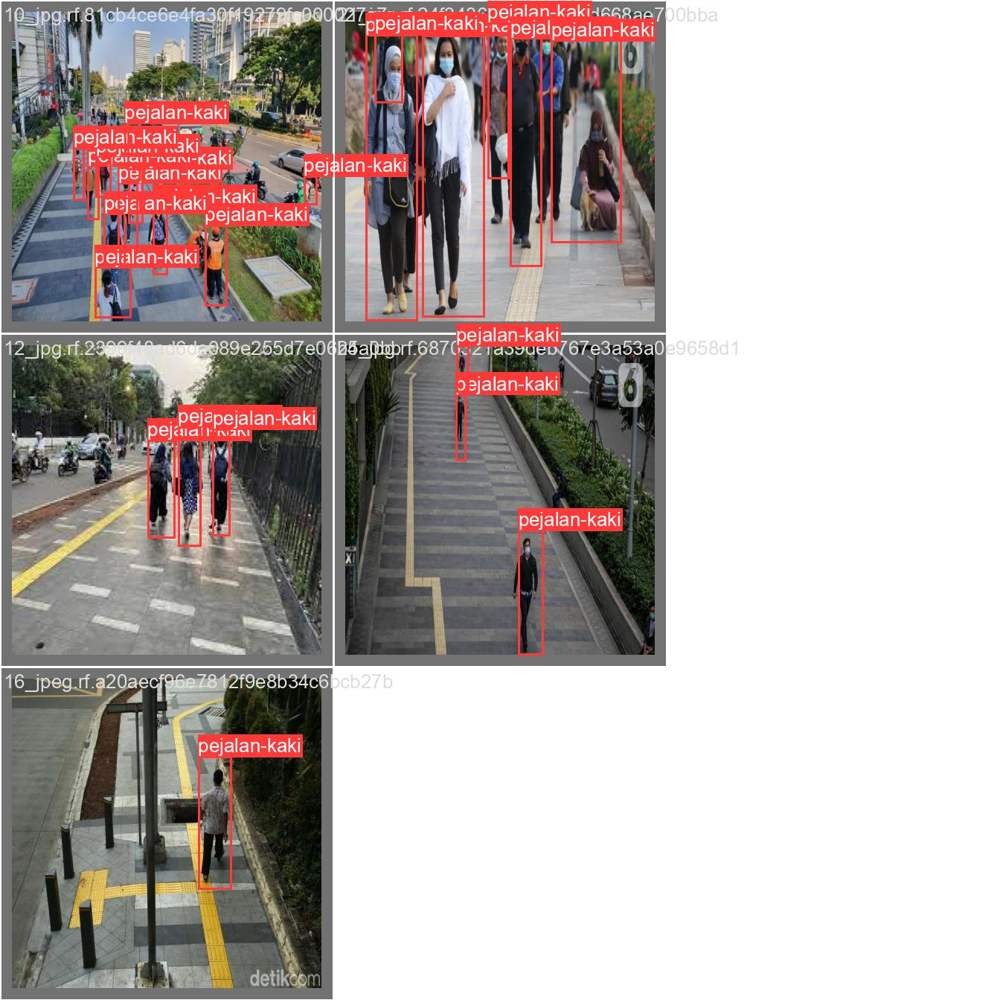

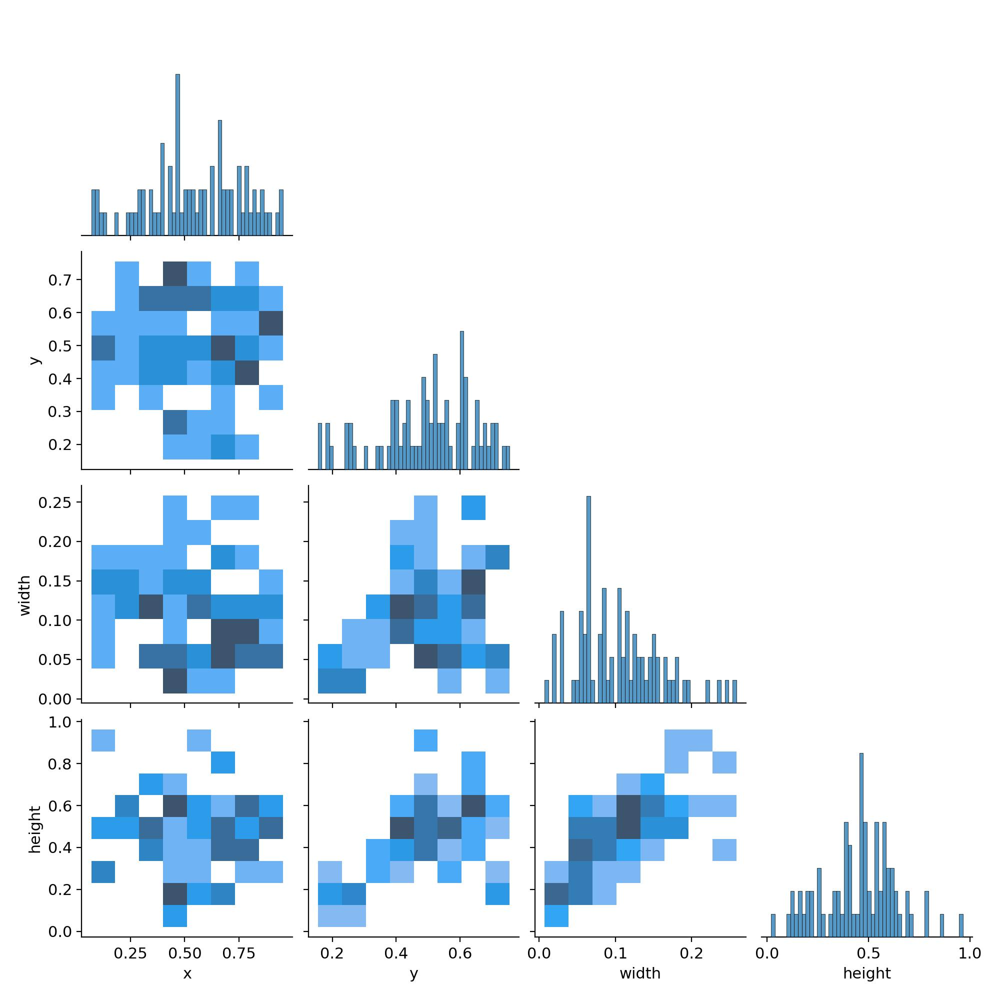

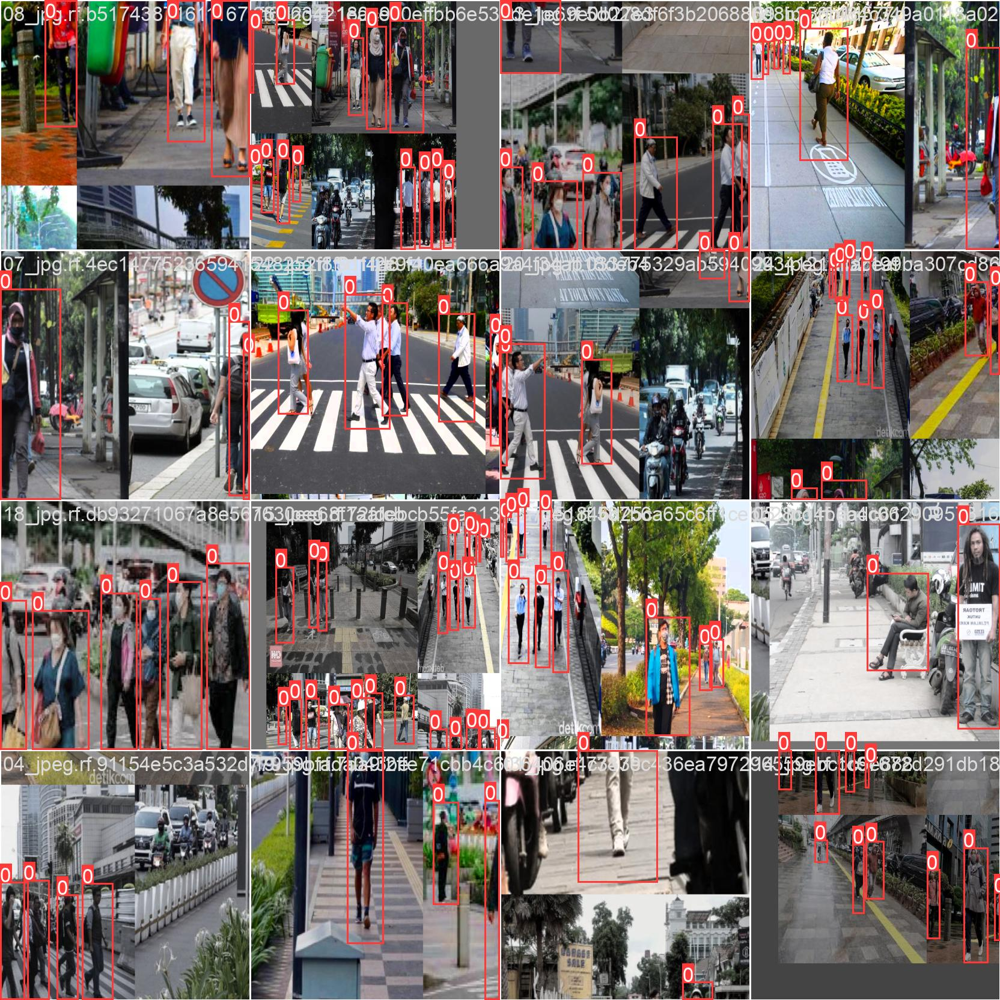

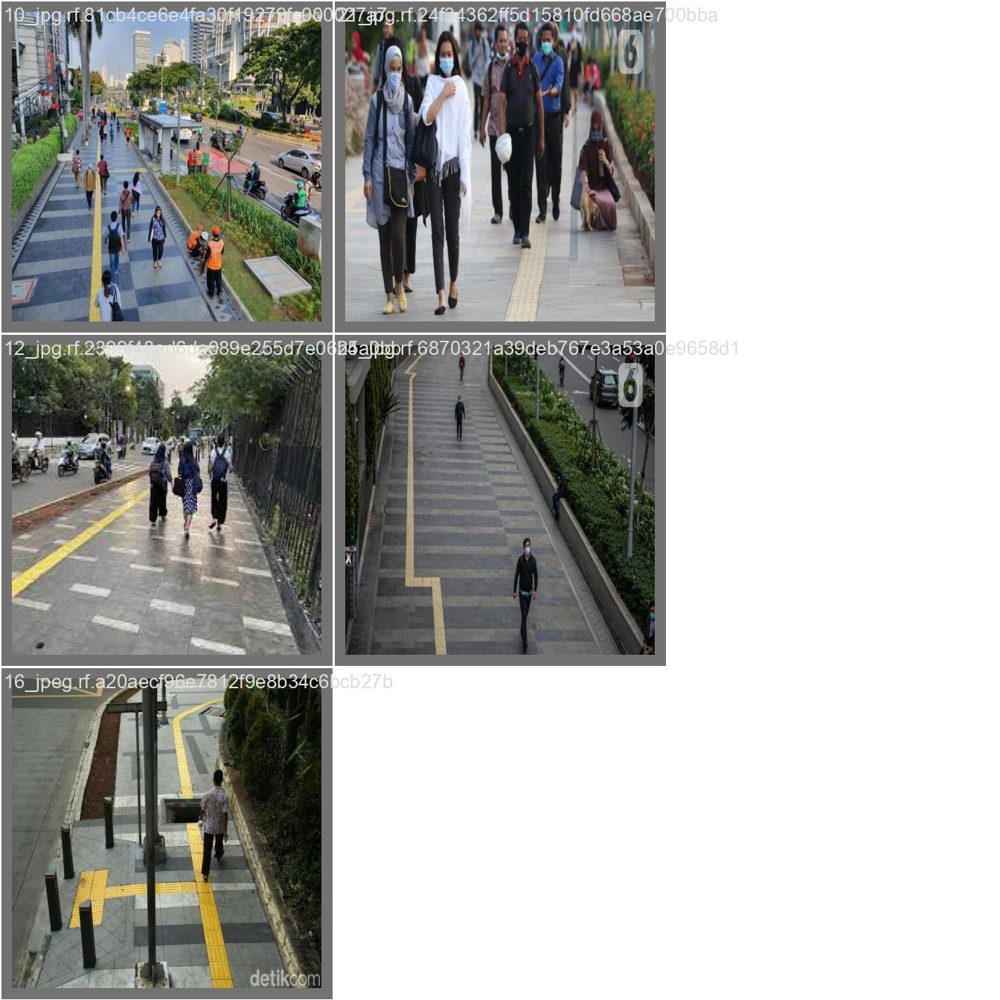

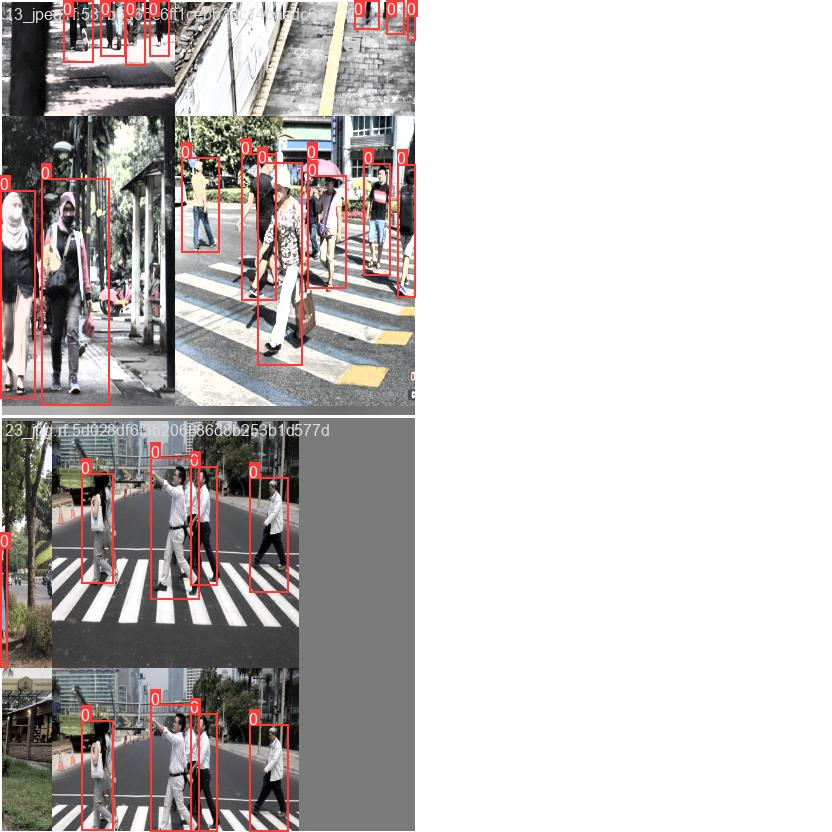

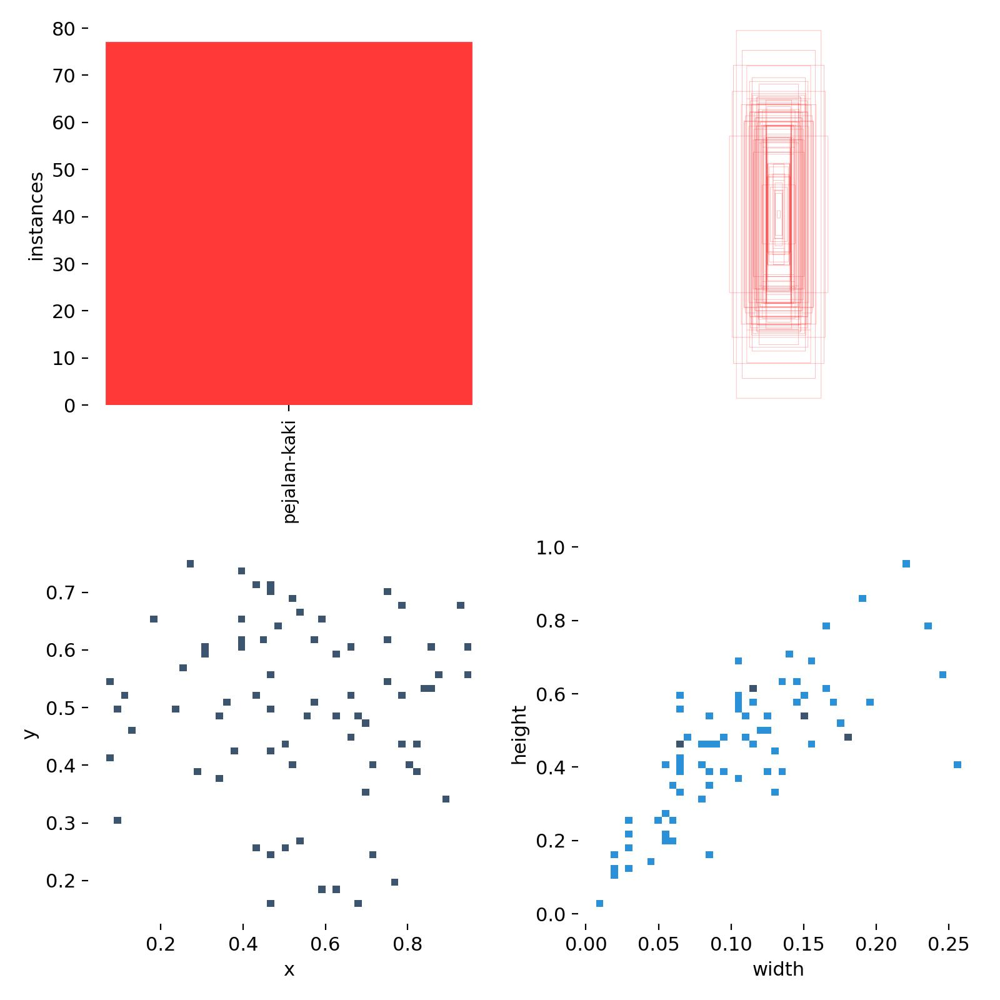

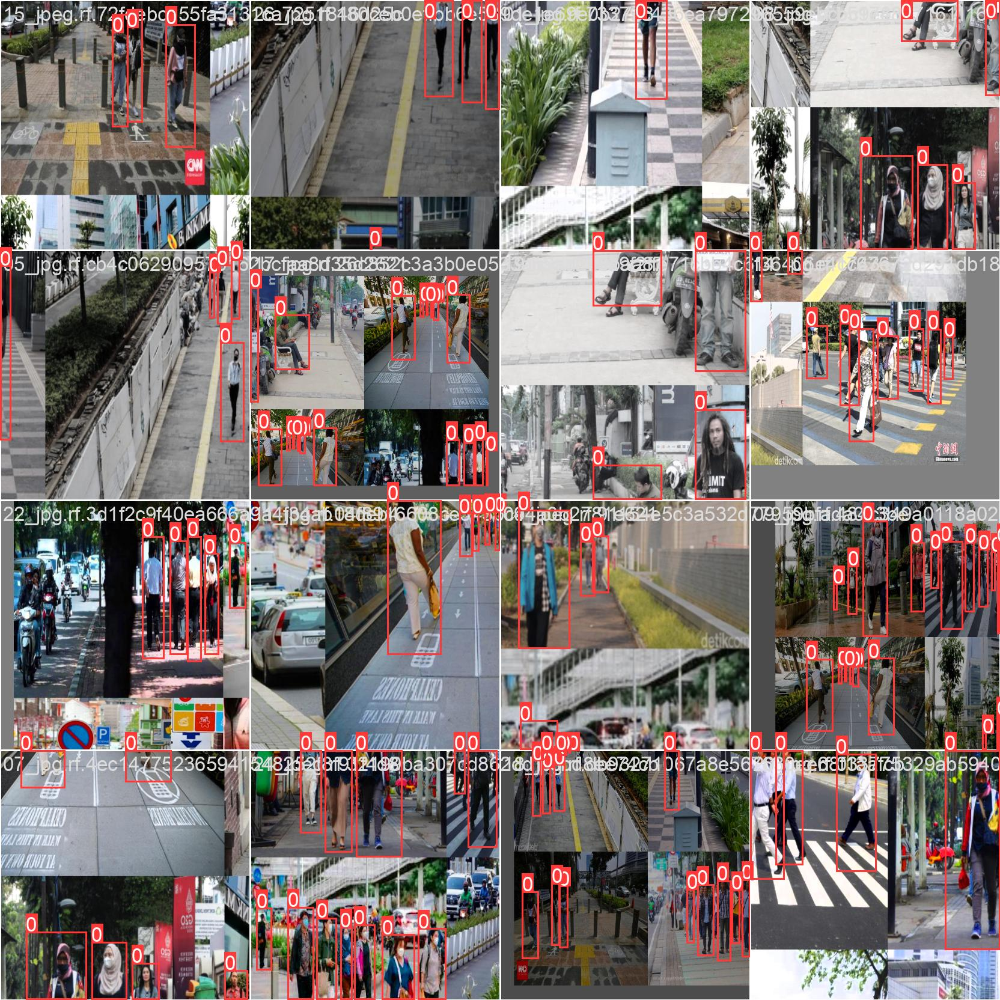

In [ ]:
# Menampilkan hasil deteksi
path_gambar = "runs/train/exp/"
file_gambar = [f for f in os.listdir(path_gambar) if f.endswith(".jpg")]

for file_gambar in file_gambar:
    path_gambar_penuh = os.path.join(path_gambar, file_gambar)
    display(Image(filename=path_gambar_penuh))